# Aguas venenosas

In [16]:
# dependencias
import pandas as pd
from   seaborn import pairplot
from   sklearn.preprocessing   import StandardScaler
from   sklearn.metrics import pairwise_distances

In [2]:
# data
path_veneno   = 'work/datasets/veneno.csv'
path_sustancias = 'work/datasets/sustancias_diversas.csv'

In [3]:
# loading
veneno_inicio   = pd.read_csv(path_veneno)
sustancias = pd.read_csv(path_sustancias)

## exploración inicial

In [4]:
# remuevo columna extra
veneno = veneno_inicio.drop(columns = 'caracteristica')

In [5]:
veneno

,v1,v2,v3,v4,v5,v6,v7,v8,v9,v10
0,21,56,2131.4,164.6,4527.9,1,2.09,3.8,538,23.7


### muestras

In [6]:
# primeros y últimos registros
print(sustancias.head())
print(sustancias.tail())

    id    v1    v2      v3     v4      v5   v6   v7   v8     v9   v10
0  517  24.7  48.5  2449.5  133.0  5044.5  1.2  2.2  3.8  568.8  19.9
1  226  21.0  56.2  2114.7  163.7  4559.6  1.0  2.1  3.8  542.8  23.7
2  615  18.2  56.8  2055.4  150.3  4718.8  0.8  2.4  4.6  431.6  23.5
3  390  20.8  56.0  2112.9  165.9  4503.9  1.0  2.1  3.8  533.9  23.9
4  172  21.0  56.4  2146.7  166.0  4492.2  1.0  2.1  3.8  543.2  23.7
      id    v1    v2      v3     v4      v5   v6   v7   v8     v9   v10
495  699  25.1  61.7  2255.6  132.4  3990.4  1.1  2.4  4.2  502.3  20.6
496  579  19.4  53.2  2203.3  182.1  4051.8  1.0  2.3  3.6  531.0  28.4
497  338  20.9  56.2  2124.7  164.6  4513.6  1.0  2.1  3.8  537.2  23.8
498  660  17.3  55.4  2121.1  153.7  4289.5  0.9  2.1  3.2  451.5  22.8
499  522  22.3  63.4  2125.8  169.3  3805.5  1.2  2.5  3.1  627.2  21.5


In [7]:
# estadistica descriptiva
sustancias.describe()

,id,v1,v2,v3,v4,v5,v6,v7,v8,v9,v10
count,500.00000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000
mean,487.33800,20.977800,55.915400,2122.973800,165.231200,4536.858200,1.001600,2.107600,3.799600,538.805200,23.677000
std,289.23473,1.667359,4.483171,165.021963,13.069945,354.197585,0.086559,0.170765,0.315021,41.981127,1.976893
min,1.00000,16.800000,45.000000,1705.700000,132.100000,3624.600000,0.800000,1.700000,3.000000,430.700000,19.000000
25%,233.75000,20.800000,55.400000,2111.050000,163.100000,4485.775000,1.000000,2.100000,3.800000,532.875000,23.500000
50%,469.50000,21.000000,55.900000,2129.800000,164.750000,4532.750000,1.000000,2.100000,3.800000,537.100000,23.700000
75%,745.25000,21.200000,56.500000,2147.625000,166.125000,4572.550000,1.000000,2.100000,3.800000,542.800000,23.900000
max,995.00000,25.200000,67.200000,2556.800000,197.500000,5430.000000,1.200000,2.500000,4.600000,644.300000,28.400000


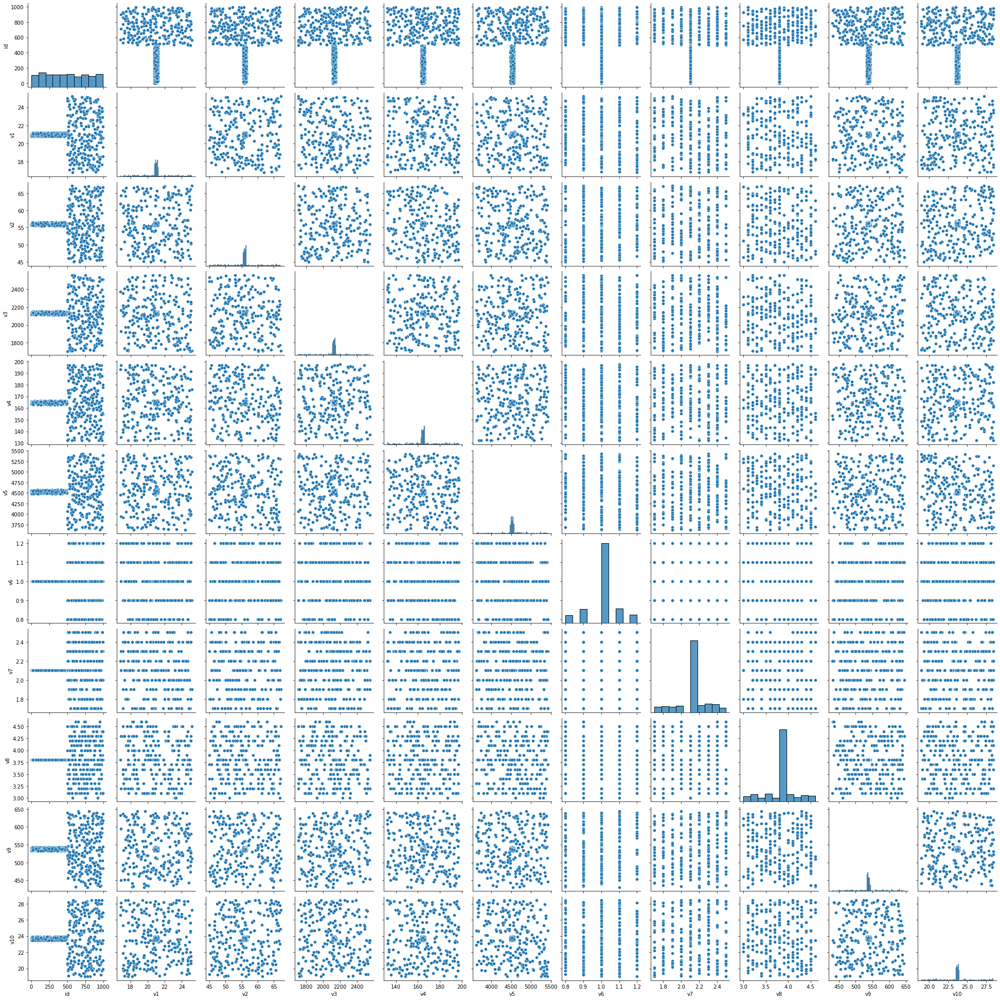

In [8]:
# scatterplot
pairplot(sustancias)

Parece que las sustancias con `id < 500` son diferentes, el promedio parecé ser el mismo pero los valores parecen estar más concentrados; recrearé la gráfica, una versión para `id < 500`, y la otra con el complemento.

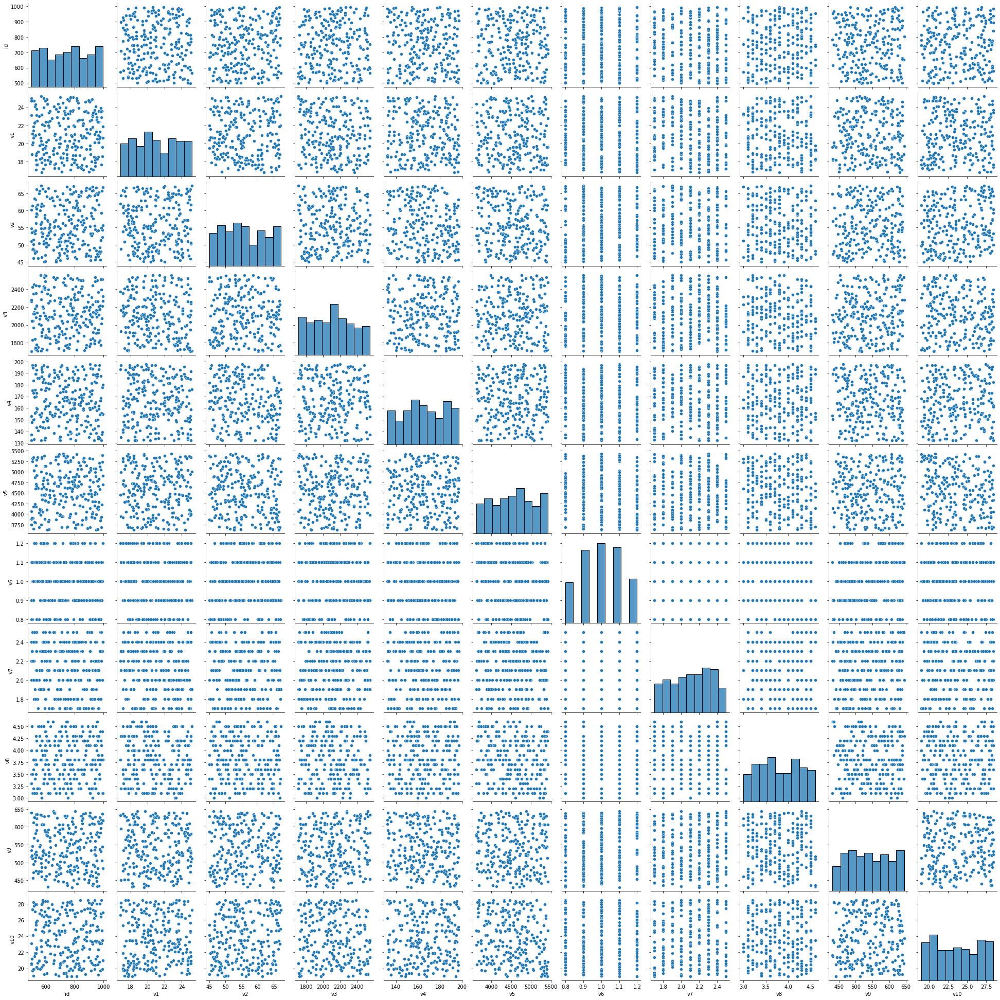

In [9]:
# después de iterar un poco encontré 498 como punto de corte
pairplot(sustancias[sustancias['id'] > 498])

A simple vista las variables `v1 a v5` parecen provenir de distribuciones uniformes, de igual modo las variables `v9 y v10`; `v7 y v8` también parecen provenir de distribuciones uniformes (con un redondeo posterior, raro para un proceso físico/químico), a primera vista diría que `v6` proviené de una distribución binomial.

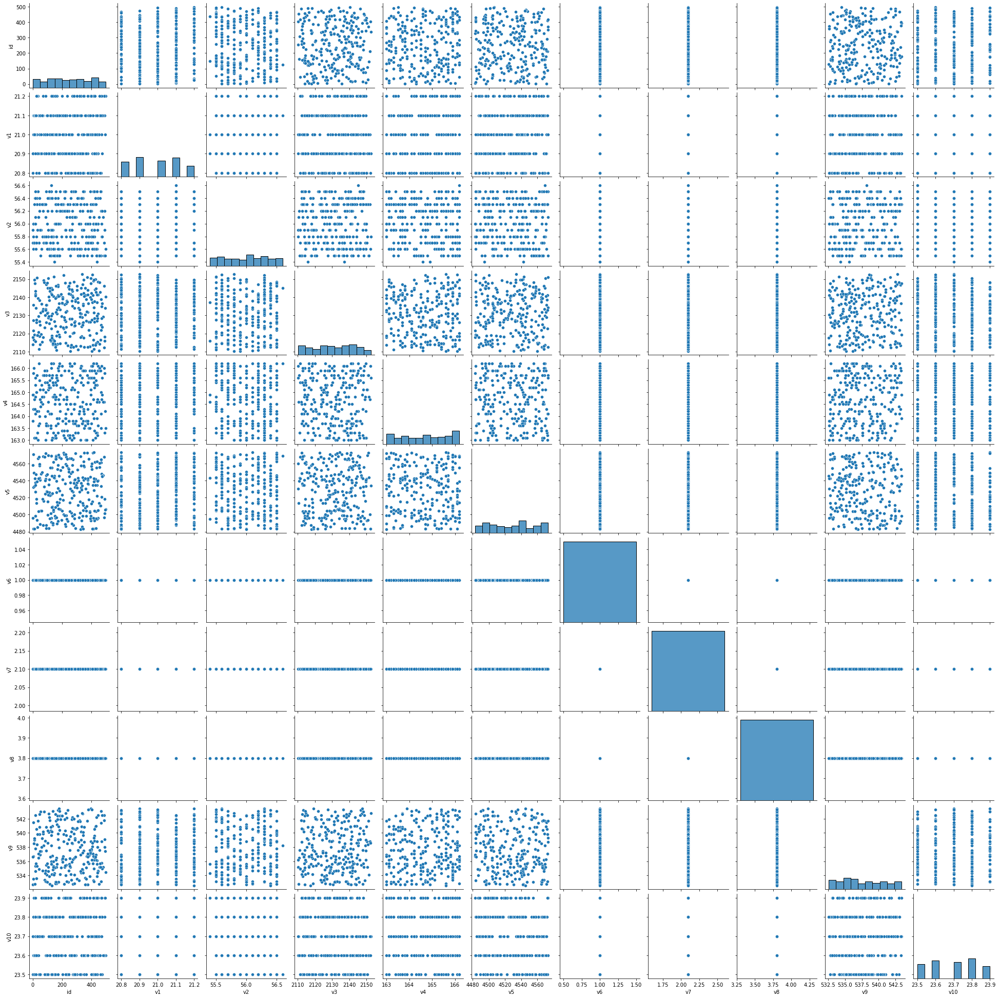

In [10]:
# ahora una gráfica para el resto
pairplot(sustancias[sustancias['id'] <= 498])

para `id <= 498` las variables `v6, v7, y v8` están concentrados alrededor de valores especificos, `v1, v2, y v10` podrían provenir de una distribucion uniforme donde los valores son discretos, el resto, `v3, v4, v5, y v9`, podrían provenir de distribuciones uniformes.

In [11]:
# número de sustancias
sustancias[sustancias['id'] <= 498].shape

(260, 11)

### estadística descriptiva de ambos grupos

In [12]:
# para id <= 498
sustancias[sustancias['id'] <= 498].describe()

,id,v1,v2,v3,v4,v5,v6,v7,v8,v9,v10
count,260.000000,260.000000,260.000000,260.000000,260.000000,260.000000,260.0,2.600000e+02,2.600000e+02,260.000000,260.000000
mean,246.530769,20.989615,55.995385,2131.073846,164.685385,4528.203462,1.0,2.100000e+00,3.800000e+00,537.644231,23.697692
std,141.203306,0.132426,0.330406,11.659663,0.990660,26.818823,0.0,9.788805e-15,1.779783e-14,3.121702,0.133538
min,1.000000,20.800000,55.400000,2110.300000,163.000000,4482.900000,1.0,2.100000e+00,3.800000e+00,532.600000,23.500000
25%,128.750000,20.900000,55.700000,2120.675000,163.800000,4503.900000,1.0,2.100000e+00,3.800000e+00,535.200000,23.600000
50%,247.000000,21.000000,56.000000,2131.350000,164.700000,4530.700000,1.0,2.100000e+00,3.800000e+00,537.200000,23.700000
75%,370.750000,21.100000,56.300000,2140.900000,165.600000,4549.275000,1.0,2.100000e+00,3.800000e+00,540.300000,23.800000
max,497.000000,21.200000,56.600000,2152.600000,166.200000,4573.100000,1.0,2.100000e+00,3.800000e+00,543.400000,23.900000


In [13]:
# id > 498
sustancias[sustancias['id'] > 498].describe()

,id,v1,v2,v3,v4,v5,v6,v7,v8,v9,v10
count,240.000000,240.00000,240.000000,240.000000,240.000000,240.000000,240.000000,240.000000,240.000000,240.000000,240.000000
mean,748.212500,20.96500,55.828750,2114.198750,165.822500,4546.234167,1.003333,2.115833,3.799167,540.062917,23.654583
std,147.083732,2.40523,6.467677,237.826122,18.839263,510.867872,0.125050,0.246480,0.455188,60.548091,2.852948
min,499.000000,16.80000,45.000000,1705.700000,132.100000,3624.600000,0.800000,1.700000,3.000000,430.700000,19.000000
25%,614.250000,18.80000,50.275000,1914.425000,152.425000,4129.250000,0.900000,1.900000,3.400000,488.650000,20.900000
50%,751.000000,20.80000,55.100000,2110.450000,164.950000,4590.950000,1.000000,2.100000,3.800000,535.200000,23.400000
75%,876.500000,23.12500,61.300000,2295.500000,183.250000,4920.225000,1.100000,2.300000,4.200000,591.350000,26.400000
max,995.000000,25.20000,67.200000,2556.800000,197.500000,5430.000000,1.200000,2.500000,4.600000,644.300000,28.400000


Los promedios son similares en ambos grupos, sin embargo para `id <= 498` los valores están más concentrados (con menor desviación estandar)

In [14]:
# características de la sustancia venenosa
veneno

,v1,v2,v3,v4,v5,v6,v7,v8,v9,v10
0,21,56,2131.4,164.6,4527.9,1,2.09,3.8,538,23.7


Los promedios de ambos conjuntos son muy similares, además, esos promedios están cercanos a los valores del veneno.

## Lagos infectados

Tenemos 50 sustancias, cada una proveniente de un lago diferente, con 10 características cada una, en diferentes escalas. Voy a determinar que tan similares son las sustancias al veneno, y proveér una lista de 50 lagos a clausurar.  

Al hablar sobre similaridad, qué tan parecidas son dos sustancias, estoy hablando sobre distancia: la distancia de una sustancia consigo misma es 0, y mientras más disimilares (o diferentes) la distancia es mayor.  

Hay varias medidas de distancia, en nuestro caso probaré dos la distancia Euclidiana y la distancia de Manhattan, en este [enlace](https://towardsdatascience.com/9-distance-measures-in-data-science-918109d069fa) hay una descripción y comparación de diferentes medidas.

In [21]:
# las características están en diferentes escalas, e.g v6 varía entre 0.8 y 1.2, mientras v5 va desde 3750 hasta 5500, para evitar que una(a) característica(s) tenga(n) un efecto desproporcionado estandarizaré cada una de las características
# separo los valores
columna_id = ['id']
sustancias_valores = sustancias.drop(columns = columna_id)
# creo el transformador
estandarizador = StandardScaler(with_mean = True, with_std = True).fit(sustancias_valores)
# transformación
sustancias_estandarizadas = estandarizador.transform(sustancias_valores)

In [25]:
# también es necesario transformar el veneno, es muy cercano al centro de las distribuciones
veneno_estandarizado = estandarizador.transform(veneno)

In [28]:
# calculo las distancias
distancia_euclidiana = pairwise_distances(sustancias_estandarizadas, veneno_estandarizado, metric = 'euclidean', n_jobs = 6) 
distancia_manhattan = pairwise_distances(sustancias_estandarizadas, veneno_estandarizado, metric = 'manhattan', n_jobs = 6) 

In [38]:
# añado las distancias a un dataframe
sustancias_enriched = sustancias.copy()
# 
sustancias_enriched['distancia_euclidiana'] = distancia_euclidiana
sustancias_enriched['distancia_manhattan'] = distancia_manhattan

## métricas propuestas
* la euclidiana
* hamming distance